In [1]:
import os
import glob
import shutil
import pydicom
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

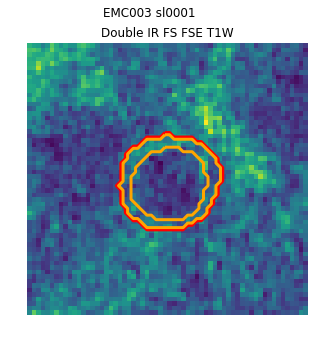

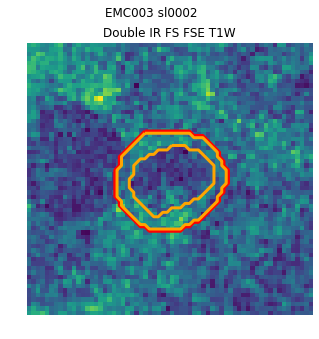

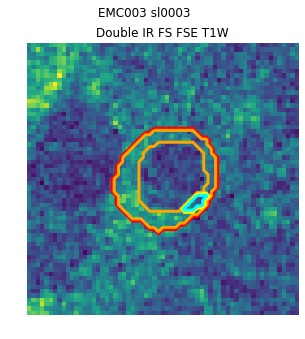

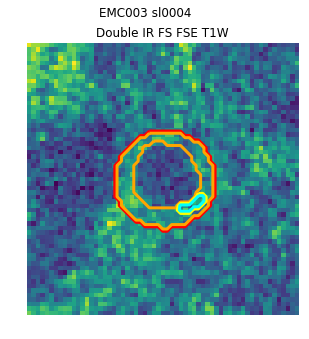

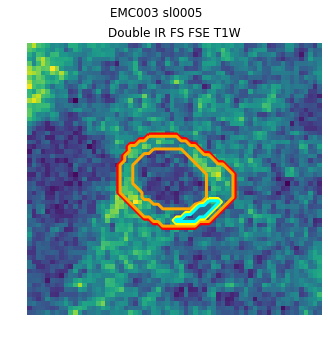

...

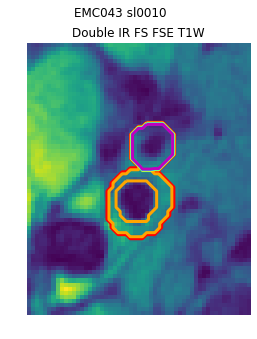

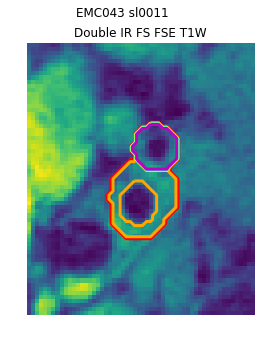

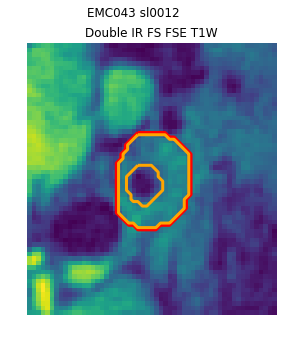

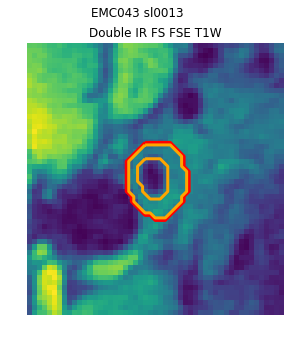

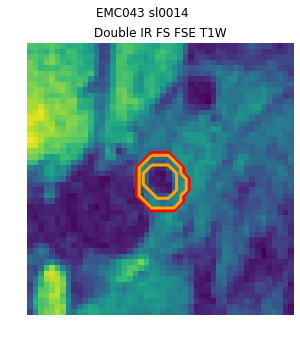

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


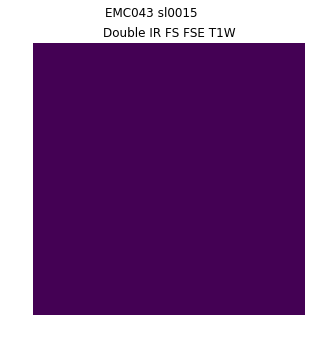

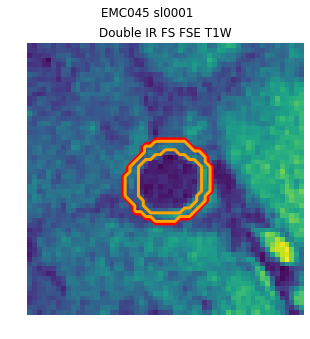

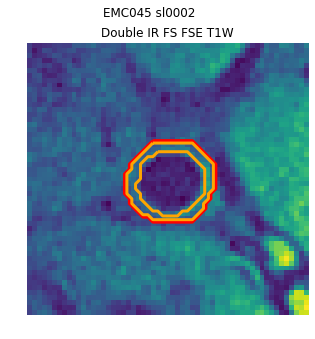

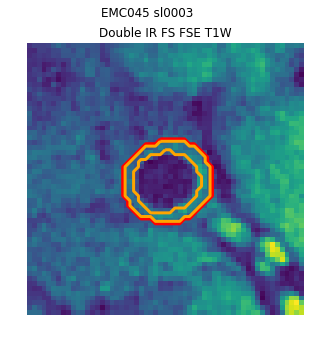

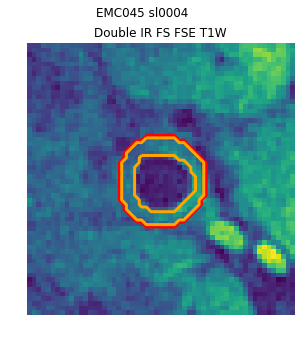

...

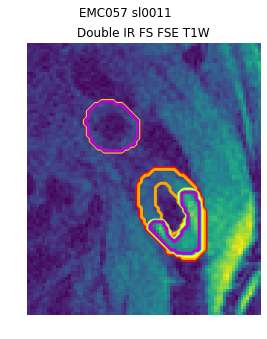

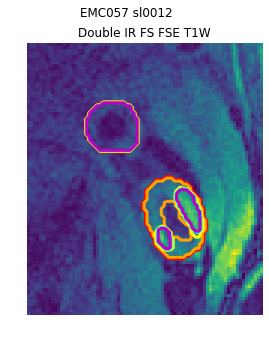

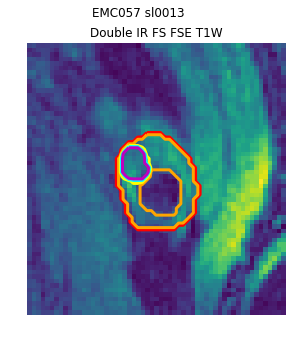

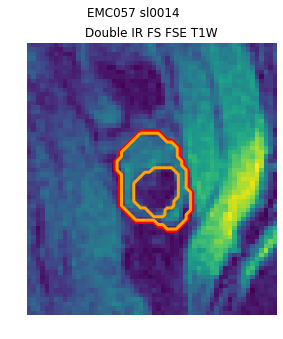

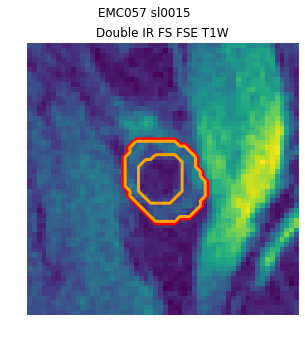

In [29]:
center_dir = 'I:/parisk_validation/EMC/'
gp = 20

for folder in os.listdir(center_dir):
    
    sub = folder[:6]
    
    
    sls = []

    for filename in glob.glob(center_dir + sub + '*/*_sl*.dcm'):
        sls.append(filename.split('_')[-2])
        
    for sl in sls:
    
        img_names = glob.glob(center_dir + sub + '*/*_' + sl + '*.dcm')
        con_name = glob.glob(center_dir + sub + '*/MASSExport/*_' + sl + '*.dcm')[0]

        imgs = []
        descrs = []

        for img_name in img_names:
            img_dcm = pydicom.read_file(img_name, force = True)
            img_dcm.file_meta.TransferSyntaxUID = pydicom.uid.ImplicitVRLittleEndian
            img = img_dcm.pixel_array
            imgs.append(img)
            descrs.append(img_dcm.SeriesDescription)

        con_dcm = pydicom.read_file(con_name, force = True)
        con_dcm.file_meta.TransferSyntaxUID = pydicom.uid.ImplicitVRLittleEndian
        con = con_dcm.pixel_array

        x_min = 0
        x_max = con.shape[0]-1
        y_min = 0
        y_max = con.shape[1]-1

        if np.sum(con)>0:
            x_min = max(0, np.min(np.where(con>0)[0])-gp)
            x_max = min(con.shape[0]-1, np.max(np.where(con>0)[0])+gp)
            y_min = max(0, np.min(np.where(con>0)[1])-gp)
            y_max = min(con.shape[0]-1, np.max(np.where(con>0)[1])+gp)

        fig, ax = plt.subplots(figsize = (20,5)) 

        for i in range (0, len(imgs)):

            plt.subplot(1, len(imgs), i+1)
            plt.imshow(imgs[i][x_min:x_max, y_min:y_max])
            plt.contour(con[x_min:x_max, y_min:y_max], levels=[0.5, 1.5, 2.5, 3.5, 4.5], 
                        colors=['r', 'orange', 'yellow', 'cyan', 'm'], linewidths=3.0)
            plt.axis('Off')
            plt.title(descrs[i])

        plt.suptitle(sub + ' ' + sl)
        plt.subplots_adjust(wspace=0, hspace=0)
        plt.show()

    